In [1]:
pip install torch torchvision transformers scikit-learn pandas matplotlib tqdm pillow rdkit-pypi logomaker


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 29.4/29.4 MB 45.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 64.5 MB/s eta 0:00:00


In [3]:
import pandas as pd
import os
import pandas as pd
from rdkit import Chem
from rdkit.Chem import Draw

import subprocess

# Load dataset
data = pd.read_csv(r"C:\Users\yash\Downloads\clg work\DRUG\output.csv")
data.head()

,compound_id,target_id,smiles,protein_sequence,ki_value
0,CHEMBL1087421,O00141,COC1=C(C=C2C(=C1)CCN=C2C3=CC(=C(C=C3)Cl)Cl)Cl,MTVKTEAAKGTLTYSRMRGMVAILIAFMKQRRMGLNDFIQKIANNS...,11.1
1,CHEMBL1087421,O14920,COC1=C(C=C2C(=C1)CCN=C2C3=CC(=C(C=C3)Cl)Cl)Cl,MSWSPSLTTQTCGAWEMKERLGTGGFGNVIRWHNQETGEQIAIKQC...,11.1
2,CHEMBL1087421,O15111,COC1=C(C=C2C(=C1)CCN=C2C3=CC(=C(C=C3)Cl)Cl)Cl,MERPPGLRPGAGGPWEMRERLGTGGFGNVCLYQHRELDLKIAIKSC...,11.1
3,CHEMBL1087421,P00533,COC1=C(C=C2C(=C1)CCN=C2C3=CC(=C(C=C3)Cl)Cl)Cl,MRPSGTAGAALLALLAALCPASRALEEKKVCQGTSNKLTQLGTFED...,11.1
4,CHEMBL1087421,P04626,COC1=C(C=C2C(=C1)CCN=C2C3=CC(=C(C=C3)Cl)Cl)Cl,MELAALCRWGLLLALLPPGAASTQVCTGTDMKLRLPASPETHLDML...,11.1


In [6]:
from rdkit import Chem
from rdkit.Chem import Draw
import os

# Create a directory to store SMILES images
SMILES_IMG_DIR = r"C:\Users\yash\smiles_images"
os.makedirs(SMILES_IMG_DIR, exist_ok=True)

# Generate images from SMILES strings if they are not already present
for index, row in data.iterrows():
    compound_id = row['compound_id']
    smiles = row['smiles']
    img_path = os.path.join(SMILES_IMG_DIR, f"{compound_id}_smiles.png")

    if os.path.exists(img_path):
        print(f"Skipping {compound_id}, image already exists.")
        continue  # Skip processing if the image exists

    mol = Chem.MolFromSmiles(smiles)
    
    if mol:
        img = Draw.MolToImage(mol, size=(300, 300))
        img.save(img_path)
        print(f"Saved SMILES image for {compound_id} at {img_path}")
    else:
        print(f"Warning: Could not generate SMILES image for compound {compound_id}")


Skipping CHEMBL1087421, image already exists.
Skipping CHEMBL1087421, image already exists.
Skipping CHEMBL1087421, image already exists.
Skipping CHEMBL1087421, image already exists.
Skipping CHEMBL1087421, image already exists.
Skipping CHEMBL1087421, image already exists.
Skipping CHEMBL1087421, image already exists.
Skipping CHEMBL1087421, image already exists.
Skipping CHEMBL1087421, image already exists.
Skipping CHEMBL1087421, image already exists.
Skipping CHEMBL1087421, image already exists.
Skipping CHEMBL1087421, image already exists.
Skipping CHEMBL1087421, image already exists.
Skipping CHEMBL1087421, image already exists.
Skipping CHEMBL1087421, image already exists.
Skipping CHEMBL1087421, image already exists.
Skipping CHEMBL1087421, image already exists.
Skipping CHEMBL1087421, image already exists.
Skipping CHEMBL1088633, image already exists.
Skipping CHEMBL1088633, image already exists.
Skipping CHEMBL1088633, image already exists.
Skipping CHEMBL1088633, image alre

In [8]:
import logomaker
import matplotlib.pyplot as plt
import pandas as pd
import os

# Amino acids list for indexing
AMINO_ACIDS = 'ACDEFGHIKLMNPQRSTVWY'

# Directory to save protein sequence logos
PROTEIN_IMG_DIR = r"C:\Users\yash\protein_images"
os.makedirs(PROTEIN_IMG_DIR, exist_ok=True)

# Function to create a frequency matrix for the protein sequence
def get_frequency_matrix(sequence):
    # Create an empty DataFrame with amino acids as columns and sequence length as rows
    frequency_matrix = pd.DataFrame(0, index=range(len(sequence)), columns=list(AMINO_ACIDS))
    
    # Populate the frequency matrix based on the sequence
    for i, amino_acid in enumerate(sequence):
        if amino_acid in frequency_matrix.columns:
            frequency_matrix.loc[i, amino_acid] = 1
            
    return frequency_matrix

# Function to create a sequence logo for a single protein sequence
def create_sequence_logo(protein_sequence, target_id):
    img_path = os.path.join(PROTEIN_IMG_DIR, f"{target_id}_protein.png")

    # Skip if the image already exists
    if os.path.exists(img_path):
        print(f"Skipping {target_id}, image already exists.")
        return

    # Generate frequency matrix from protein sequence
    frequency_matrix = get_frequency_matrix(protein_sequence)
    
    # Plot the sequence logo
    plt.figure(figsize=(10, 3))
    logo = logomaker.Logo(frequency_matrix)
    plt.title(f"Sequence Logo for Target {target_id}")
    plt.xlabel("Position")
    plt.ylabel("Amino Acid")
    
    # Save the plot
    plt.savefig(img_path)
    plt.close()
    print(f"Saved protein sequence logo for {target_id} at {img_path}")

# Generate and save logos for each protein sequence
for index, row in data.iterrows():
    protein_sequence = row['protein_sequence']
    target_id = row['target_id']
    create_sequence_logo(protein_sequence, target_id)


Skipping O00141, image already exists.
Skipping O14920, image already exists.
Skipping O15111, image already exists.
Skipping P00533, image already exists.
Skipping P04626, image already exists.
Skipping P06239, image already exists.
Skipping P07333, image already exists.
Skipping P15056, image already exists.
Skipping P24941, image already exists.
Skipping P28482, image already exists.
Skipping P45983, image already exists.
Skipping P45984, image already exists.
Skipping P49841, image already exists.
Skipping P53350, image already exists.
Skipping P53779, image already exists.
Skipping Q13464, image already exists.
Skipping Q16539, image already exists.
Skipping Q16584, image already exists.
Skipping O00141, image already exists.
Skipping O14920, image already exists.
Skipping O15111, image already exists.
Skipping P00533, image already exists.
Skipping P04626, image already exists.
Skipping P06239, image already exists.
Skipping P07333, image already exists.
Skipping P15056, image al

config.json:   0%|          | 0.00/4.19k [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/605M [00:00<?, ?B/s]

/usr/local/lib/python3.10/dist-packages/transformers/optimization.py:591: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  warnings.warn(
100%|██████████| 647/647 [30:13<00:00,  2.80s/it]


Epoch [1/3], Train Loss: 1.4461, Val Loss: 0.4692


100%|██████████| 647/647 [29:29<00:00,  2.74s/it]


Epoch [2/3], Train Loss: 0.4170, Val Loss: 0.3900


100%|██████████| 647/647 [29:34<00:00,  2.74s/it]


Epoch [3/3], Train Loss: 0.3830, Val Loss: 0.3785


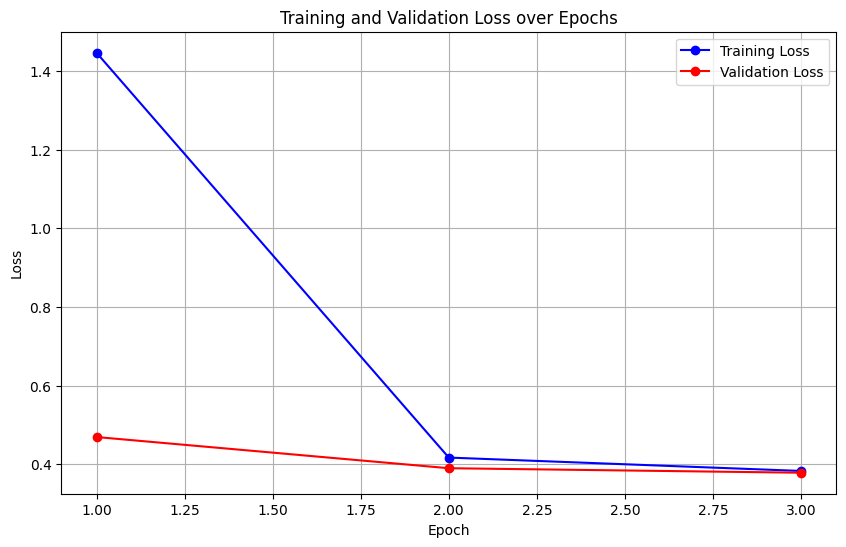

Test Loss: 0.3651


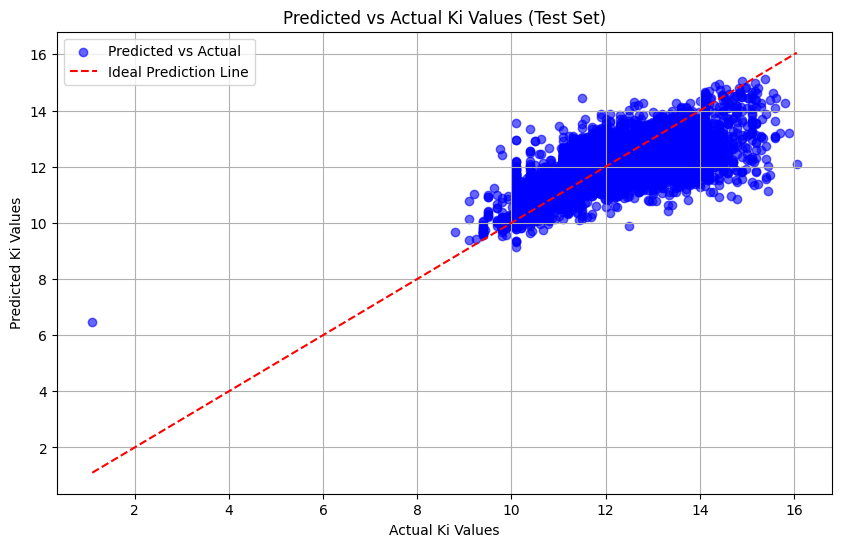

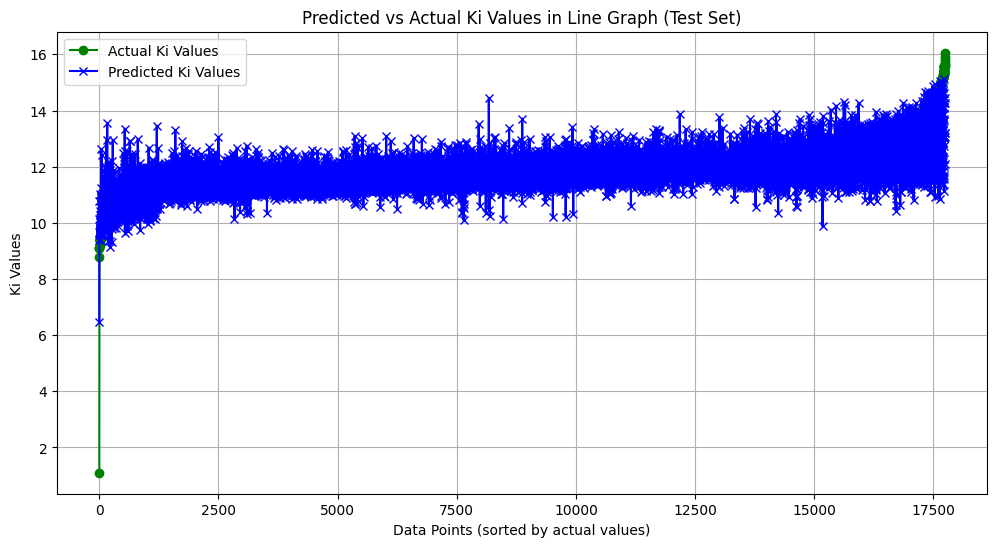

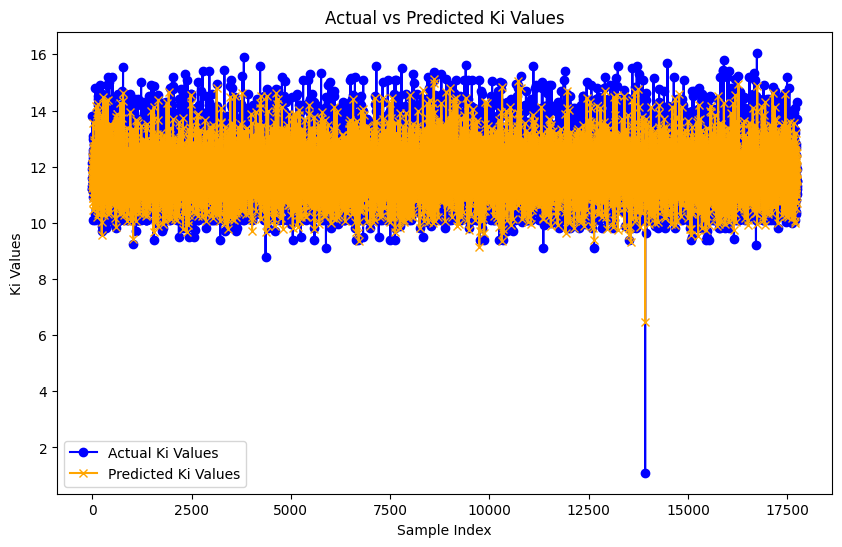

In [5]:
import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from transformers import CLIPModel
from sklearn.model_selection import train_test_split
import os
import pandas as pd
import matplotlib.pyplot as plt
from tqdm import tqdm
from torchvision import transforms
from transformers import AdamW
from PIL import Image

# Load dataset
data = pd.read_csv("output.csv")  # Path to your dataset

# Directory setup for storing images
SMILES_IMG_DIR = "/content/smiles_images/smiles_images"
PROTEIN_IMG_DIR = "/content/protein_images/protein_images"

# Initialize GPU/Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Define the transformation to match CLIP's input requirements
clip_transform = transforms.Compose([
    transforms.ToPILImage(),
    transforms.Resize((224, 224)),
    transforms.Lambda(lambda x: x.convert("RGB")),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.48145466, 0.4578275, 0.40821073],
        std=[0.26862954, 0.26130258, 0.27577711]
    )
])

# Dataset class
class DrugProteinDataset(Dataset):
    def __init__(self, data, smiles_img_dir, protein_img_dir, transform=None):
        self.data = data
        self.smiles_img_dir = smiles_img_dir
        self.protein_img_dir = protein_img_dir
        self.transform = transform

    def __len__(self):
        return len(self.data)

    def __getitem__(self, idx):
        row = self.data.iloc[idx]
        smiles_image_path = os.path.join(self.smiles_img_dir, f"{row['compound_id']}_smiles.png")
        protein_image_path = os.path.join(self.protein_img_dir, f"{row['target_id']}_protein.png")

        smiles_image = plt.imread(smiles_image_path)
        protein_image = plt.imread(protein_image_path)

        # Apply transformation
        smiles_image = clip_transform(smiles_image)
        protein_image = clip_transform(protein_image)

        # Ki value as the target
        ki_value = torch.tensor(row['ki_value'], dtype=torch.float32)

        return smiles_image, protein_image, ki_value

# Model class
class DrugProteinInteractionModel(nn.Module):
    def __init__(self):
        super(DrugProteinInteractionModel, self).__init__()
        self.clip_model = CLIPModel.from_pretrained("openai/clip-vit-base-patch32")
        self.output_dim = self.clip_model.vision_model.config.hidden_size
        self.fc = nn.Linear(self.output_dim, 1)

    def forward(self, smiles_image, protein_image):
        smiles_features = self.clip_model.vision_model(smiles_image).last_hidden_state.mean(dim=1)
        protein_features = self.clip_model.vision_model(protein_image).last_hidden_state.mean(dim=1)
        combined_features = smiles_features + protein_features
        output = self.fc(combined_features)
        return output

# Split dataset into train, val, and test
train_data, temp_data = train_test_split(data, test_size=0.3, random_state=42)
val_data, test_data = train_test_split(temp_data, test_size=0.5, random_state=42)

train_dataset = DrugProteinDataset(train_data, SMILES_IMG_DIR, PROTEIN_IMG_DIR)
val_dataset = DrugProteinDataset(val_data, SMILES_IMG_DIR, PROTEIN_IMG_DIR)
test_dataset = DrugProteinDataset(test_data, SMILES_IMG_DIR, PROTEIN_IMG_DIR)

# DataLoader with GPU utilization enhancements
train_loader = DataLoader(train_dataset, batch_size=128, shuffle=True, num_workers=2, pin_memory=True)
val_loader = DataLoader(val_dataset, batch_size=128, num_workers=2, pin_memory=True)
test_loader = DataLoader(test_dataset, batch_size=128, num_workers=2, pin_memory=True)

# Model, loss, and optimizer
model = DrugProteinInteractionModel().to(device)
criterion = nn.MSELoss()
optimizer = AdamW(model.parameters(), lr=1e-5)

# Training loop
num_epochs = 3
train_losses, val_losses = [], []
for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    for smiles_image, protein_image, ki_value in tqdm(train_loader):
        # Move data to GPU
        smiles_image, protein_image, ki_value = smiles_image.to(device, non_blocking=True), protein_image.to(device, non_blocking=True), ki_value.to(device, non_blocking=True)

        optimizer.zero_grad()
        outputs = model(smiles_image, protein_image)
        loss = criterion(outputs.squeeze(), ki_value)
        loss.backward()
        optimizer.step()
        running_loss += loss.item()

    avg_train_loss = running_loss / len(train_loader)
    train_losses.append(avg_train_loss)

    model.eval()
    val_loss = 0.0
    with torch.no_grad():
        for smiles_image, protein_image, ki_value in val_loader:
            smiles_image, protein_image, ki_value = smiles_image.to(device, non_blocking=True), protein_image.to(device, non_blocking=True), ki_value.to(device, non_blocking=True)
            outputs = model(smiles_image, protein_image)
            loss = criterion(outputs.squeeze(), ki_value)
            val_loss += loss.item()

    avg_val_loss = val_loss / len(val_loader)
    val_losses.append(avg_val_loss)
    print(f"Epoch [{epoch+1}/{num_epochs}], Train Loss: {avg_train_loss:.4f}, Val Loss: {avg_val_loss:.4f}")

# Plot Training and Validation Loss
plt.figure(figsize=(10, 6))
plt.plot(range(1, num_epochs + 1), train_losses, label="Training Loss", color='blue', marker='o')
plt.plot(range(1, num_epochs + 1), val_losses, label="Validation Loss", color='red', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss over Epochs')
plt.legend()
plt.grid(True)
plt.show()

# Testing the model
model.eval()
test_loss = 0.0
actual_test_values, predicted_test_values = [], []
with torch.no_grad():
    for smiles_image, protein_image, ki_value in test_loader:
        smiles_image, protein_image, ki_value = smiles_image.to(device, non_blocking=True), protein_image.to(device, non_blocking=True), ki_value.to(device, non_blocking=True)
        outputs = model(smiles_image, protein_image)
        loss = criterion(outputs.squeeze(), ki_value)
        test_loss += loss.item()
        actual_test_values.extend(ki_value.cpu().numpy())
        predicted_test_values.extend(outputs.squeeze().cpu().numpy())

avg_test_loss = test_loss / len(test_loader)
print(f"Test Loss: {avg_test_loss:.4f}")

# Scatter Plot - Predicted vs Actual Ki values (Test Set)
plt.figure(figsize=(10, 6))
plt.scatter(actual_test_values, predicted_test_values, color='blue', alpha=0.6, label='Predicted vs Actual')
plt.plot([min(actual_test_values), max(actual_test_values)], [min(actual_test_values), max(actual_test_values)], color='red', linestyle='--', label='Ideal Prediction Line')
plt.xlabel('Actual Ki Values')
plt.ylabel('Predicted Ki Values')
plt.title('Predicted vs Actual Ki Values (Test Set)')
plt.legend()
plt.grid(True)
plt.show()

# Line Graph - Sorted Predicted vs Actual Ki values
sorted_indices = sorted(range(len(actual_test_values)), key=lambda k: actual_test_values[k])
sorted_actual = [actual_test_values[i] for i in sorted_indices]
sorted_predicted = [predicted_test_values[i] for i in sorted_indices]

plt.figure(figsize=(12, 6))
plt.plot(sorted_actual, label="Actual Ki Values", color='green', marker='o', linestyle='-')
plt.plot(sorted_predicted, label="Predicted Ki Values", color='blue', marker='x', linestyle='-')
plt.xlabel('Data Points (sorted by actual values)')
plt.ylabel('Ki Values')
plt.title('Predicted vs Actual Ki Values in Line Graph (Test Set)')
plt.legend()
plt.grid(True)
plt.show()

# Save the model
torch.save(model.state_dict(), "drug_protein_interaction_model.pth")


# Create DataFrame from actual and predicted values
results_df = pd.DataFrame({
    'Actual Ki Values': actual_test_values,
    'Predicted Ki Values': predicted_test_values
})

# Plot the Actual vs Predicted Ki Values
plt.figure(figsize=(10, 6))

# Plot the actual Ki values
plt.plot(results_df.index, results_df['Actual Ki Values'], label='Actual Ki Values', color='blue', marker='o')

# Plot the predicted Ki values
plt.plot(results_df.index, results_df['Predicted Ki Values'], label='Predicted Ki Values', color='orange', marker='x')

# Add labels and title
plt.xlabel('Sample Index')
plt.ylabel('Ki Values')
plt.title('Actual vs Predicted Ki Values')
plt.legend()

# Show the plot
plt.show()



In [7]:
from sklearn.metrics import mean_squared_error
import numpy as np


# Calculate MSE and RMSE
mse = mean_squared_error(actual_test_values, predicted_test_values)
rmse = np.sqrt(mse)

print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"Root Mean Squared Error (RMSE): {rmse:.4f}")


Mean Squared Error (MSE): 0.3649
Root Mean Squared Error (RMSE): 0.6041
